In [1]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
import random
from PIL import Image
from collections import Counter
from pathlib import Path

import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

In [2]:
print(torch.__version__)
print("CUDA available:", torch.cuda.is_available())

2.6.0+cu124
CUDA available: True


In [3]:
from google.colab import drive
drive.mount('/content/drive')



Mounted at /content/drive


In [4]:
import zipfile

zip_path = '/content/drive/MyDrive/XrayClassificationproject/archive(25).zip'

extract_path = '/content/data'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("✅ Extraction complete!")



✅ Extraction complete!


In [5]:
import os
from pathlib import Path

train_path = Path("/content/data/train")
val_path = Path("/content/data/val")
test_path = Path("/content/data/test")

def count_images(folder_path):
    class_counts = {}
    for class_dir in os.listdir(folder_path):
        class_path = folder_path / class_dir
        if class_path.is_dir():
            count = len(os.listdir(class_path))
            class_counts[class_dir] = count
    return class_counts

train_counts = count_images(train_path)
val_counts = count_images(val_path)
test_counts = count_images(test_path)

print("Train:", train_counts)
print("Val:", val_counts)
print("Test:", test_counts)


Train: {'COVID19': 460, 'NORMAL': 1341, 'PNEUMONIA': 3875, 'TURBERCULOSIS': 650}
Val: {'COVID19': 10, 'NORMAL': 8, 'PNEUMONIA': 8, 'TURBERCULOSIS': 12}
Test: {'COVID19': 106, 'NORMAL': 234, 'PNEUMONIA': 390, 'TURBERCULOSIS': 41}


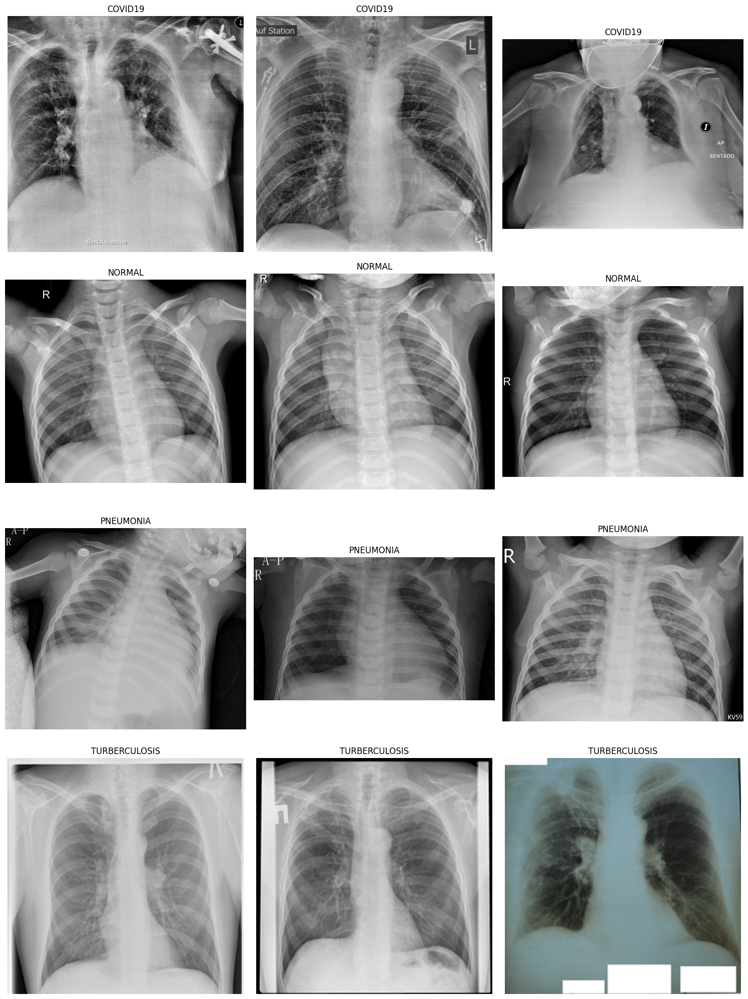

In [6]:


def show_samples(folder_path, samples_per_class=3):
    class_dirs = os.listdir(folder_path)
    plt.figure(figsize=(15, 5 * len(class_dirs)))

    for idx, class_name in enumerate(class_dirs):
        class_folder = folder_path / class_name
        image_files = os.listdir(class_folder)
        samples = random.sample(image_files, samples_per_class)

        for i, img_file in enumerate(samples):
            img_path = class_folder / img_file
            image = Image.open(img_path)
            plt.subplot(len(class_dirs), samples_per_class, idx * samples_per_class + i + 1)
            plt.imshow(image, cmap='gray')
            plt.title(f"{class_name}")
            plt.axis('off')

    plt.tight_layout()
    plt.show()

show_samples(train_path)


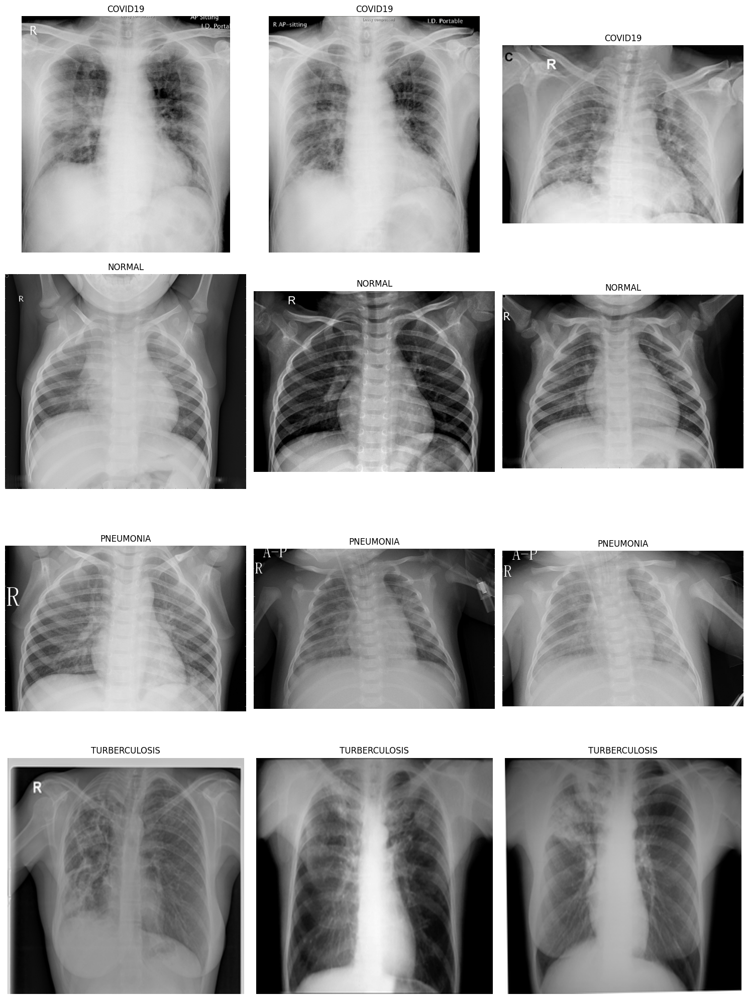

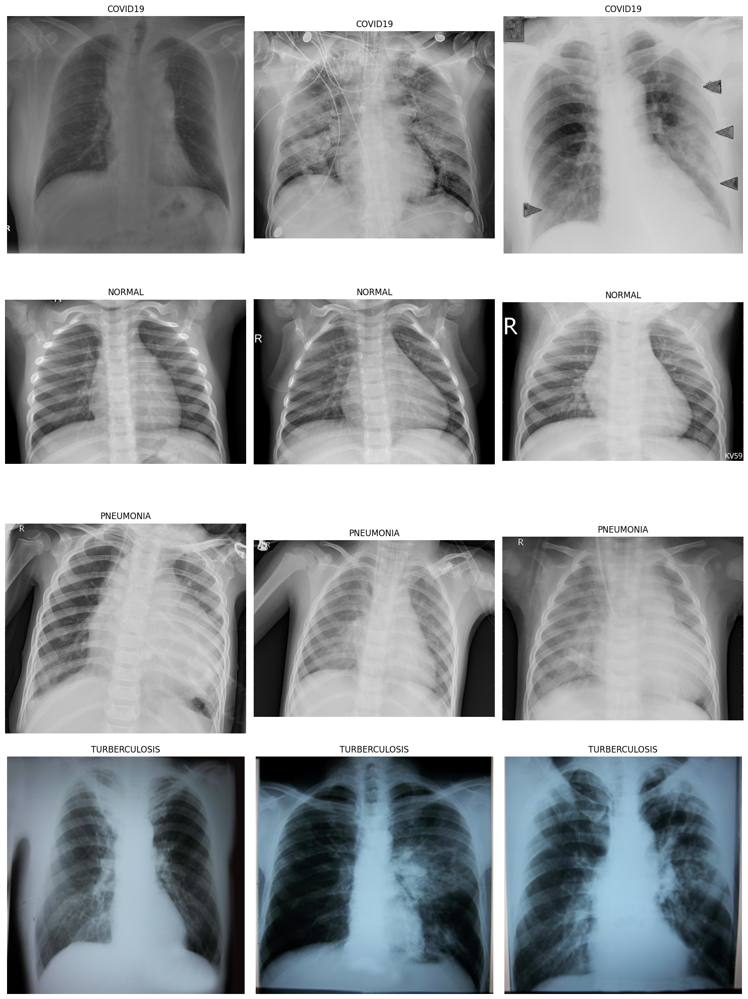

In [7]:
show_samples(val_path)
show_samples(test_path)

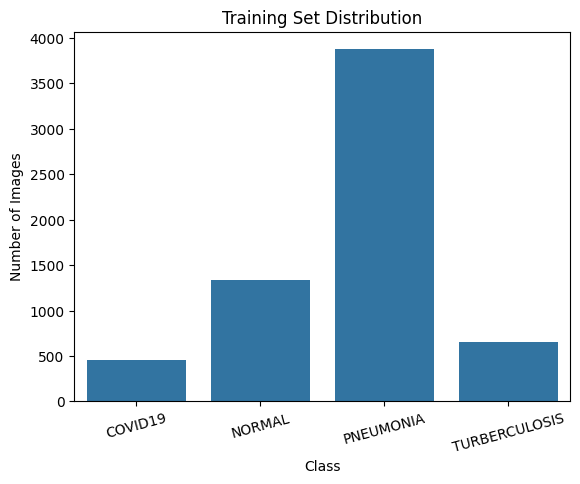

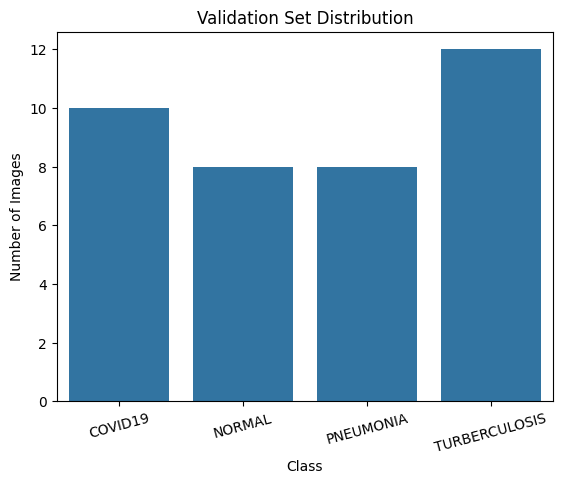

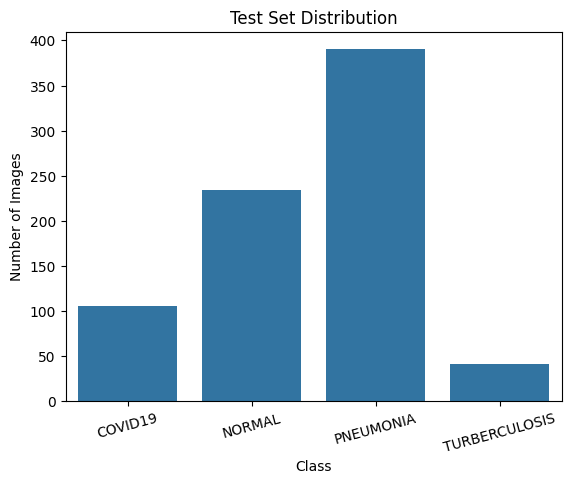

In [8]:


def plot_class_distribution(count_dict, title):
    labels = list(count_dict.keys())
    values = list(count_dict.values())

    sns.barplot(x=labels, y=values)
    plt.title(title)
    plt.ylabel("Number of Images")
    plt.xlabel("Class")
    plt.xticks(rotation=15)
    plt.show()

plot_class_distribution(train_counts, "Training Set Distribution")
plot_class_distribution(val_counts, "Validation Set Distribution")
plot_class_distribution(test_counts, "Test Set Distribution")


In [9]:

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])


In [10]:
from torchvision.datasets import ImageFolder

train_path = "/content/data/train"
val_path = "/content/data/val"
test_path = "/content/data/test"

train_dataset = ImageFolder(root=train_path, transform=transform)
val_dataset = ImageFolder(root=val_path, transform=transform)
test_dataset = ImageFolder(root=test_path, transform=transform)


In [11]:


train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


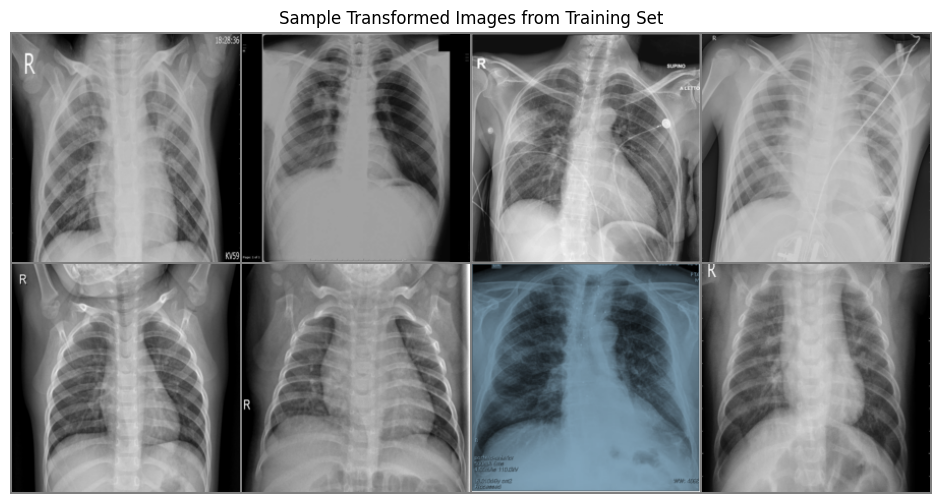

In [13]:
import torchvision

dataiter = iter(train_loader)
images, labels = next(dataiter)


img_grid = torchvision.utils.make_grid(images[:8], nrow=4)


img_grid = img_grid * 0.5 + 0.5


plt.figure(figsize=(12, 6))
plt.imshow(img_grid.permute(1, 2, 0))
plt.title("Sample Transformed Images from Training Set")
plt.axis('off')
plt.show()


In [14]:

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


Using device: cuda


In [15]:
import torchvision.models as models
import torch.nn as nn


model = models.resnet18(pretrained=True)


for param in model.parameters():
    param.requires_grad = False

num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 4)

model = model.to(device)




/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 92.8MB/s]


In [16]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np



class_counts = [460, 1341, 3875, 650]

labels_list = []
for idx, count in enumerate(class_counts):
    labels_list.extend([idx] * count)


class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(labels_list), y=labels_list)
class_weights_tensor = torch.FloatTensor(class_weights).to(device)

print("Class Weights:", class_weights_tensor)


Class Weights: tensor([3.4380, 1.1793, 0.4081, 2.4331], device='cuda:0')


In [17]:

criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)


In [18]:
import torch.optim as optim

optimizer = optim.Adam(model.parameters(), lr=0.001)


In [19]:

import time


def train_model(model, criterion, optimizer, train_loader, val_loader, device, num_epochs=10):
    model.train()

    train_loss_list = []
    val_loss_list = []
    train_acc_list = []
    val_acc_list = []

    for epoch in range(num_epochs):
        start_time = time.time()
        running_loss = 0.0
        correct = 0
        total = 0

        model.train()
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_acc = correct / total
        train_loss = running_loss / len(train_loader)

        model.eval()
        val_correct = 0
        val_total = 0
        val_loss = 0.0

        with torch.no_grad():
            for val_inputs, val_labels in val_loader:
                val_inputs, val_labels = val_inputs.to(device), val_labels.to(device)
                val_outputs = model(val_inputs)
                loss = criterion(val_outputs, val_labels)
                val_loss += loss.item()

                _, val_preds = torch.max(val_outputs, 1)
                val_correct += (val_preds == val_labels).sum().item()
                val_total += val_labels.size(0)

        val_acc = val_correct / val_total
        val_loss = val_loss / len(val_loader)

        train_loss_list.append(train_loss)
        val_loss_list.append(val_loss)
        train_acc_list.append(train_acc)
        val_acc_list.append(val_acc)

        print(f"Epoch {epoch+1}/{num_epochs} - "
              f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f} | "
              f"Time: {(time.time() - start_time):.2f}s")

    return model, train_loss_list, val_loss_list, train_acc_list, val_acc_list



In [20]:
trained_model, train_loss_list, val_loss_list, train_acc_list, val_acc_list = train_model(
    model, criterion, optimizer, train_loader, val_loader, device, num_epochs=10)



Epoch 1/10 - Train Loss: 0.5227, Train Acc: 0.8215 | Val Loss: 0.4440, Val Acc: 0.8158 | Time: 116.93s
Epoch 2/10 - Train Loss: 0.2716, Train Acc: 0.9097 | Val Loss: 0.3598, Val Acc: 0.8158 | Time: 114.82s
Epoch 3/10 - Train Loss: 0.2265, Train Acc: 0.9200 | Val Loss: 0.2735, Val Acc: 0.8421 | Time: 114.13s
Epoch 4/10 - Train Loss: 0.1963, Train Acc: 0.9282 | Val Loss: 0.2475, Val Acc: 0.8158 | Time: 113.03s
Epoch 5/10 - Train Loss: 0.1724, Train Acc: 0.9396 | Val Loss: 0.2078, Val Acc: 0.8947 | Time: 114.60s
Epoch 6/10 - Train Loss: 0.1619, Train Acc: 0.9358 | Val Loss: 0.1646, Val Acc: 0.8947 | Time: 115.10s
Epoch 7/10 - Train Loss: 0.1541, Train Acc: 0.9426 | Val Loss: 0.1911, Val Acc: 0.8684 | Time: 113.53s
Epoch 8/10 - Train Loss: 0.1420, Train Acc: 0.9431 | Val Loss: 0.1845, Val Acc: 0.8947 | Time: 114.00s
Epoch 9/10 - Train Loss: 0.1321, Train Acc: 0.9475 | Val Loss: 0.2114, Val Acc: 0.8421 | Time: 113.52s
Epoch 10/10 - Train Loss: 0.1281, Train Acc: 0.9461 | Val Loss: 0.1989, V

In [21]:
torch.save(trained_model.state_dict(), '/content/resnet18_xray.pth')


In [22]:
def get_predictions(model, dataloader, device):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return np.array(all_labels), np.array(all_preds)


In [23]:
from sklearn.metrics import classification_report


y_true, y_pred = get_predictions(trained_model, test_loader, device)

print(classification_report(y_true, y_pred, target_names=test_dataset.classes))


               precision    recall  f1-score   support

      COVID19       0.99      0.92      0.96       106
       NORMAL       0.93      0.72      0.81       234
    PNEUMONIA       0.85      0.96      0.91       390
TURBERCULOSIS       0.78      0.98      0.87        41

     accuracy                           0.88       771
    macro avg       0.89      0.90      0.89       771
 weighted avg       0.89      0.88      0.88       771



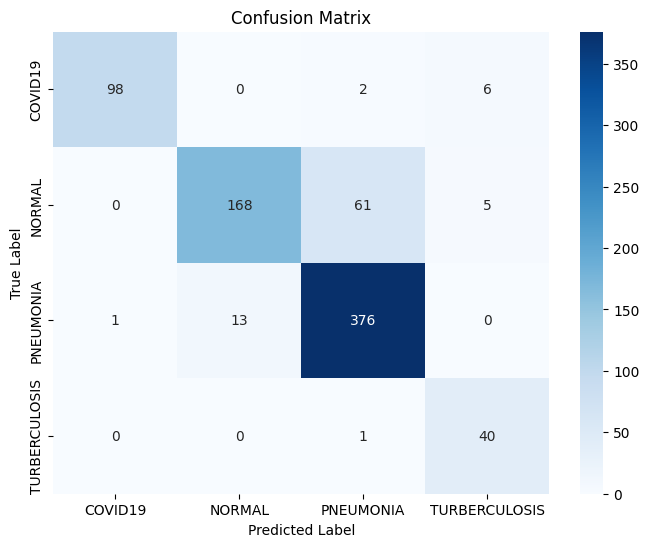

In [24]:
from sklearn.metrics import confusion_matrix


cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=test_dataset.classes, yticklabels=test_dataset.classes)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


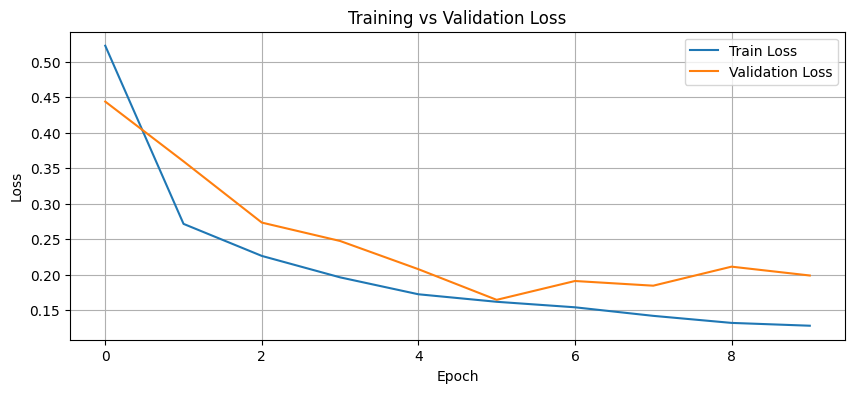

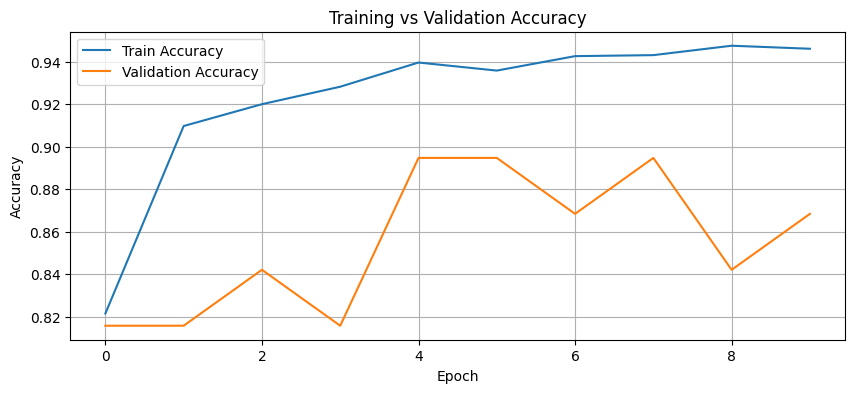

In [25]:

plt.figure(figsize=(10, 4))
plt.plot(train_loss_list, label="Train Loss")
plt.plot(val_loss_list, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.grid()
plt.show()


plt.figure(figsize=(10, 4))
plt.plot(train_acc_list, label="Train Accuracy")
plt.plot(val_acc_list, label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training vs Validation Accuracy")
plt.legend()
plt.grid()
plt.show()



In [26]:
!pip install grad-cam



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 75.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 108.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 89.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 74.4 MB/s 

In [27]:
import cv2
import numpy as np
from torchvision import transforms
import matplotlib.pyplot as plt

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image



In [28]:
def preprocess_for_gradcam(img_tensor):
    img = img_tensor.squeeze().permute(1, 2, 0).cpu().numpy()
    img = img * 0.5 + 0.5  # De-normalize
    return img





In [34]:
for param in trained_model.layer4[1].conv2.parameters():
    param.requires_grad = True


In [35]:
target_layer = trained_model.layer4[1].conv2


In [40]:
def visualize_gradcam_batch(model, data_loader, device, target_layer, class_names, num_images=5):
    model.eval()
    images_done = 0

    data_iter = iter(data_loader)
    images, labels = next(data_iter)
    images, labels = images.to(device), labels.to(device)

    cam = GradCAM(model=model, target_layers=[target_layer])


    fig, axs = plt.subplots(num_images, 2, figsize=(8, 4 * num_images))
    fig.suptitle("Grad-CAM Visualization", fontsize=18)

    for idx in range(num_images):
        img_tensor = images[idx].unsqueeze(0)
        rgb_img = preprocess_for_gradcam(images[idx])

        output = model(img_tensor)
        pred_class = output.argmax().item()

        grayscale_cam = cam(input_tensor=img_tensor, targets=[ClassifierOutputTarget(pred_class)])[0]
        cam_image = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

        axs[idx, 0].imshow(rgb_img)
        axs[idx, 0].set_title(f"Original | True: {class_names[labels[idx]]}")
        axs[idx, 0].axis('off')

        axs[idx, 1].imshow(cam_image)
        probs = torch.nn.functional.softmax(output, dim=1)
        confidence = probs[0, pred_class].item()
        axs[idx, 1].set_title(f"Grad-CAM | {class_names[pred_class]} ({confidence:.1%})")

        axs[idx, 1].axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.show()


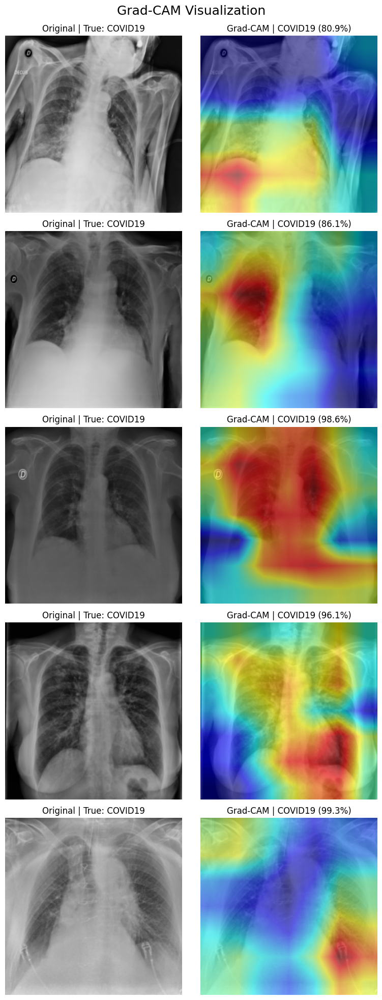

In [41]:
visualize_gradcam_batch(
    model=trained_model,
    data_loader=test_loader,
    device=device,
    target_layer=target_layer,
    class_names=test_dataset.classes,
    num_images=5
)


In [42]:
import random

def get_class_samples(dataset, class_idx, count):


    class_indices = [i for i, (_, label) in enumerate(dataset) if label == class_idx]
    chosen_indices = random.sample(class_indices, count)
    return [dataset[i] for i in chosen_indices]


In [47]:
samples = get_class_samples(test_dataset, class_idx=2, count=5)


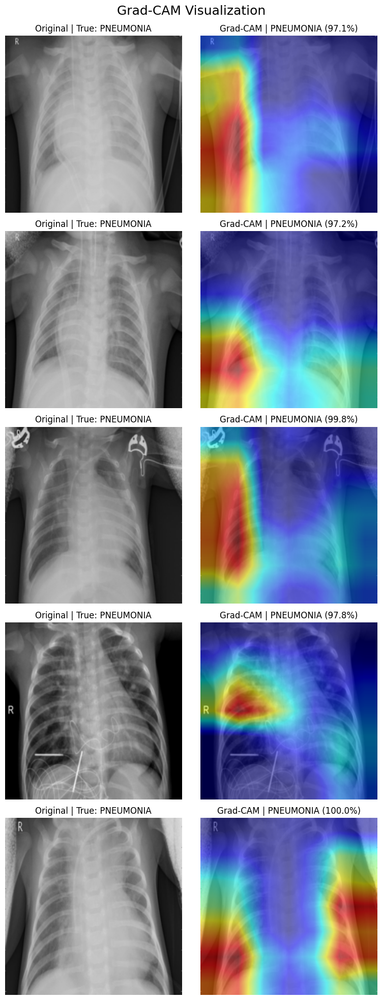

In [48]:
from torch.utils.data import DataLoader

sample_loader = DataLoader(samples, batch_size=5, shuffle=False)

visualize_gradcam_batch(
    model=trained_model,
    data_loader=sample_loader,
    device=device,
    target_layer=target_layer,
    class_names=test_dataset.classes,
    num_images=5
)
